In [358]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import datetime 

In [78]:
df = pd.read_csv ("marathon.csv")

C:\Users\jprav\AppData\Local\Temp\ipykernel_18556\4231460905.py:1: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv ("marathon.csv")


In [79]:
df.columns

Index(['Year of event', 'Event dates', 'Event name', 'Event distance/length',
       'Event number of finishers', 'Athlete performance', 'Athlete club',
       'Athlete country', 'Athlete year of birth', 'Athlete gender',
       'Athlete age category', 'Athlete average speed', 'Athlete ID'],
      dtype='object')

In [80]:
df["Athlete country"].value_counts().head()

Athlete country
USA    1389960
FRA    1170884
RSA     877630
JPN     603132
GER     442056
Name: count, dtype: int64

In [81]:
df = df[df["Athlete country"]== "GER"]

In [82]:
df.shape

(442056, 13)

In [83]:
df ["Event distance/length"].value_counts()

Event distance/length
100km                 76351
50km                  62240
72.7km                25329
24h                   21464
6h                    20255
                      ...  
100Miles                  1
18d                       1
108.1km                   1
83mi                      1
2906.1mi/64Etappen        1
Name: count, Length: 1197, dtype: int64

- Selecting only top 5 event distances

In [84]:
df = df[df["Event distance/length"].isin (["100km", "50km", "72.7km"])]

In [85]:
df.sample(5)

,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID
4381855,2006,20.05.2006,GutsMuths-Rennsteiglauf (GER),72.7km,1557,8:05:50 h,Stolpertruppe Winsen,GER,1960.0,M,M45,8.978,375714
4749228,2009,03.01.2009,Hochharz Adventure Run 50km (GER),50km,8,9:22:12 h,TSV Rethen,GER,1968.0,M,M40,5.336,1072672
5172701,2011,21.05.2011,GutsMuths-Rennsteiglauf (GER),72.7km,1950,8:06:34 h,DSC Dransfeld,GER,1976.0,M,M35,8.965,1290569
5087646,2011,05.03.2011,"50km Rund um die Steinmühle, Marburg - offener...",50km,197,4:49:41 h,LT Hemsbach,GER,1961.0,M,M50,10.356,59236
3613505,1996,19.10.1996,Int. Deutscher 100km-Lauf des SSC Hanau-Rodenb...,50km,253,4:22:47 h,Triathlon Waldeck,GER,1969.0,M,M20,11.416,750536


In [86]:
df["Athlete club"].isnull().sum()

np.int64(10833)

In [87]:
df["Event name"].value_counts()

Event name
100 km Lauf Biel (SUI)                                 33467
GutsMuths-Rennsteiglauf (GER)                          25328
100 km Lauf Unna (GER)                                 10854
50km-Ultramarathon des RLT Rodgau (GER)                 8547
Schwäbische Alb Marathon (GER)                          6154
                                                       ...  
Run4Water 24 hours Run - 100km Split (USA)                 1
Chicamocha Canyon 100 Km Race (COL)                        1
Trail des Volcans - 50km (FRA)                             1
Ultra Trail Mexico Series (UTMS) - Mascota 50 (MEX)        1
Qiansen Trophy Aohan 50 Ultra Trail (CHN)                  1
Name: count, Length: 1948, dtype: int64

In [88]:
df.isnull().sum()

Year of event                    0
Event dates                      0
Event name                       0
Event distance/length            0
Event number of finishers        0
Athlete performance              0
Athlete club                 10833
Athlete country                  0
Athlete year of birth         3069
Athlete gender                   0
Athlete age category          2919
Athlete average speed            0
Athlete ID                       0
dtype: int64

In [89]:
df[df.duplicated()]

,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID
6994240,1983,03.-04.09.1983,100 km Lauf Unna (GER),100km,579,11:45:10 h,*Frankfurt,GER,1943.0,M,M40,8509.0,1565269


In [90]:
df= df.drop_duplicates()

In [91]:
df.loc[df.duplicated()]

,Year of event,Event dates,Event name,Event distance/length,Event number of finishers,Athlete performance,Athlete club,Athlete country,Athlete year of birth,Athlete gender,Athlete age category,Athlete average speed,Athlete ID


In [92]:
df=df.dropna(subset=['Athlete year of birth'])

In [93]:
df.isnull().sum()

Year of event                    0
Event dates                      0
Event name                       0
Event distance/length            0
Event number of finishers        0
Athlete performance              0
Athlete club                 10478
Athlete country                  0
Athlete year of birth            0
Athlete gender                   0
Athlete age category             0
Athlete average speed            0
Athlete ID                       0
dtype: int64

In [94]:
df =df.rename (columns= {
    "Year of event" : "event_year",
    "Event dates" : "event_dates",
    "Event name" : "event_name",
    "Event distance/length" : "event_distance",
    "Athlete performance" : "athlete_performance",
    "Athlete club" : "athlete_club",
    "Athlete country" : "athlete_country",
    "Athlete year of birth" : "athlete_year_of_birth",
    "Athlete gender" : "gender",
    "Athlete age category" : "age_category",
    "Athlete average speed" : "average_speed",
    "Athlete ID" : "id"
})

In [95]:
df.columns

Index(['event_year', 'event_dates', 'event_name', 'event_distance',
       'Event number of finishers', 'athlete_performance', 'athlete_club',
       'athlete_country', 'athlete_year_of_birth', 'gender', 'age_category',
       'average_speed', 'id'],
      dtype='object')

In [96]:
df.dtypes

event_year                     int64
event_dates                   object
event_name                    object
event_distance                object
Event number of finishers      int64
athlete_performance           object
athlete_club                  object
athlete_country               object
athlete_year_of_birth        float64
gender                        object
age_category                  object
average_speed                 object
id                             int64
dtype: object

In [97]:
df["athlete_year_of_birth"]= df["athlete_year_of_birth"].astype("int")

In [98]:
df

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id
2701,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59 h,NaN,GER,1964,F,W50,8.451,2077
7335,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29 h,NaN,GER,1987,M,M23,7.848,6682
7432,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46 h,NaN,GER,1958,M,M55,6.032,6779
12195,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29 h,NaN,GER,1962,M,M55,11.091,11504
12217,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38 h,NaN,GER,1985,F,W23,9.415,11526
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7460171,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:18:59 h,Lobby f. Wohnsitzlose,GER,1963,M,M30,9405.0,1047303
7460172,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:21:59 h,*Dorsten,GER,1955,M,M40,9317.0,1069898
7460173,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:22:59 h,LLG St.Augustin,GER,1950,F,W45,9288.0,1047475
7460915,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17 h,TG Heilbronn,GER,1968,M,M23,9128.0,119856


In [99]:
df.dtypes

event_year                    int64
event_dates                  object
event_name                   object
event_distance               object
Event number of finishers     int64
athlete_performance          object
athlete_club                 object
athlete_country              object
athlete_year_of_birth         int64
gender                       object
age_category                 object
average_speed                object
id                            int64
dtype: object

In [100]:
df["Age_at_event"]= df["event_year"] - df["athlete_year_of_birth"]

In [101]:
df.sample(5)

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
4382073,2006,20.05.2006,GutsMuths-Rennsteiglauf (GER),72.7km,1557,8:32:21 h,TV Grossen Buseck,GER,1960,M,M45,8.514,219847,46
3637501,1996,07.-08.06.1996,100 km Lauf Biel (SUI),100km,1863,10:19:53 h,*Burgstädt,GER,1962,M,M23,9.679,380435,34
3685313,1997,06.-07.06.1997,100 km Lauf Biel (SUI),100km,1665,14:27:01 h,*Heddesheim,GER,1942,M,M50,6.92,1063074,55
5284118,2012,28.01.2012,50km-Ultramarathon des RLT Rodgau (GER),50km,558,4:31:56 h,TG Naurod,GER,1968,M,M40,11.032,341933,44
3208693,2022,09.04.2022,HaWei100 - 100 km Ultralauf rund um den Hardts...,100km,51,11:52:24 h,LG Wittgenstein - TUS ...,GER,1939,M,M80,8.422,234164,83


In [102]:
df["athlete_performance"]=df["athlete_performance"].str.split(' ').str.get(0)

In [ ]:
df= df.reset_index ()

In [114]:
df.columns

Index(['level_0', 'index', 'event_year', 'event_dates', 'event_name',
       'event_distance', 'Event number of finishers', 'athlete_performance',
       'athlete_club', 'athlete_country', 'athlete_year_of_birth', 'gender',
       'age_category', 'average_speed', 'id', 'Age_at_event'],
      dtype='object')

In [115]:
df.drop(["level_0", "index"], axis=1)

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
0,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59,NaN,GER,1964,F,W50,8.451,2077,54
1,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29,NaN,GER,1987,M,M23,7.848,6682,31
2,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46,NaN,GER,1958,M,M55,6.032,6779,60
3,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29,NaN,GER,1962,M,M55,11.091,11504,56
4,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38,NaN,GER,1985,F,W23,9.415,11526,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160845,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:18:59,Lobby f. Wohnsitzlose,GER,1963,M,M30,9405.0,1047303,32
160846,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:21:59,*Dorsten,GER,1955,M,M40,9317.0,1069898,40
160847,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:22:59,LLG St.Augustin,GER,1950,F,W45,9288.0,1047475,45
160848,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17,TG Heilbronn,GER,1968,M,M23,9128.0,119856,27


In [117]:
df["athlete_club"].isna().sum()

np.int64(10478)

In [118]:
df.drop(["athlete_club", "athlete_year_of_birth", "age_category"], axis=1)

,level_0,index,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_country,gender,average_speed,id,Age_at_event
0,0,0,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59,GER,F,8.451,2077,54
1,1,1,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29,GER,M,7.848,6682,31
2,2,2,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46,GER,M,6.032,6779,60
3,3,3,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29,GER,M,11.091,11504,56
4,4,4,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38,GER,F,9.415,11526,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
160845,160845,160845,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:18:59,GER,M,9405.0,1047303,32
160846,160846,160846,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:21:59,GER,M,9317.0,1069898,40
160847,160847,160847,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:22:59,GER,F,9288.0,1047475,45
160848,160848,160848,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17,GER,M,9128.0,119856,27


In [122]:
df.head()

,level_0,index,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
0,0,0,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59,NaN,GER,1964,F,W50,8.451,2077,54
1,1,1,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29,NaN,GER,1987,M,M23,7.848,6682,31
2,2,2,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46,NaN,GER,1958,M,M55,6.032,6779,60
3,3,3,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29,NaN,GER,1962,M,M55,11.091,11504,56
4,4,4,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38,NaN,GER,1985,F,W23,9.415,11526,33


In [127]:
new_df = df.drop(["level_0", "index"],axis=1)

In [128]:
new_df

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
0,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59,NaN,GER,1964,F,W50,8.451,2077,54
1,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29,NaN,GER,1987,M,M23,7.848,6682,31
2,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46,NaN,GER,1958,M,M55,6.032,6779,60
3,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29,NaN,GER,1962,M,M55,11.091,11504,56
4,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38,NaN,GER,1985,F,W23,9.415,11526,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160845,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:18:59,Lobby f. Wohnsitzlose,GER,1963,M,M30,9405.0,1047303,32
160846,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:21:59,*Dorsten,GER,1955,M,M40,9317.0,1069898,40
160847,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:22:59,LLG St.Augustin,GER,1950,F,W45,9288.0,1047475,45
160848,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17,TG Heilbronn,GER,1968,M,M23,9128.0,119856,27


<Axes: title={'center': 'Participants By Event'}, xlabel='Total Participants', ylabel='Event Name'>

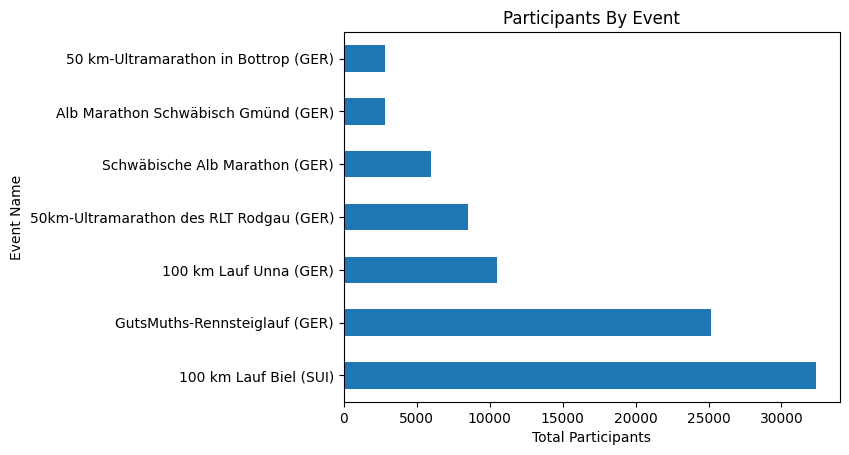

In [136]:
new_df ["event_name"].value_counts().head(7).plot (kind= "barh", title= "Participants By Event", xlabel="Total Participants", ylabel= "Event Name", )

In [169]:
px.histogram (new_df, x= "event_distance", color= "gender", text_auto= True, width= 850, title= "Participants By Age")  #Typo "Participants by gender"


In [172]:
new_df.query ('event_distance == "100km" and gender== "M"').shape

(65708, 14)

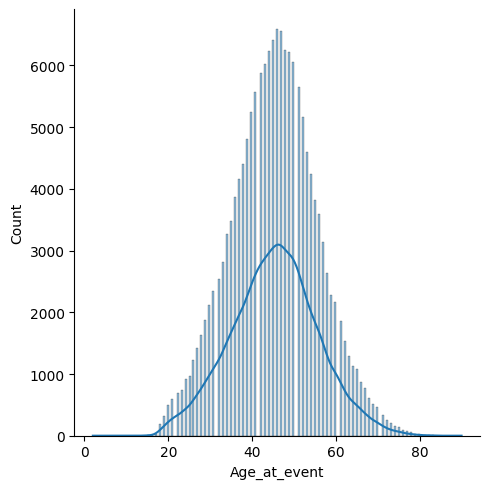

In [175]:
sns.displot (new_df, x= "Age_at_event", kind= "hist", kde= True ,legend= True)

In [179]:
px.density_heatmap (new_df, x= "Age_at_event", title= "Density heatmap of age at the time of event with index")

In [186]:
new_df["event_distance"].unique().shape

(3,)

In [206]:
new_df

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
0,2018,18.03.2018,VijverRun (BEL),50km,41,5:54:59,NaN,GER,1964,F,W50,8.451,2077,54
1,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,12:44:29,NaN,GER,1987,M,M23,7.848,6682,31
2,2018,17.-18.03.2018,TITI 100km Road Ultra Marathon (MAS),100km,252,16:34:46,NaN,GER,1958,M,M55,6.032,6779,60
3,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,4:30:29,NaN,GER,1962,M,M55,11.091,11504,56
4,2018,17.03.2018,L'Elchertoise de JPP 50 km (BEL),50km,76,5:18:38,NaN,GER,1985,F,W23,9.415,11526,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160845,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:18:59,Lobby f. Wohnsitzlose,GER,1963,M,M30,9405.0,1047303,32
160846,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:21:59,*Dorsten,GER,1955,M,M40,9317.0,1069898,40
160847,1995,26.02.1995,60 km Marburg - 50 km Split (GER),50km,120,5:22:59,LLG St.Augustin,GER,1950,F,W45,9288.0,1047475,45
160848,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17,TG Heilbronn,GER,1968,M,M23,9128.0,119856,27


- Distribution for average speed less than 30

In [234]:
new_df[new_df.index == 160848]

,event_year,event_dates,event_name,event_distance,Event number of finishers,athlete_performance,athlete_club,athlete_country,athlete_year_of_birth,gender,age_category,average_speed,id,Age_at_event
160848,1995,29.01.1995,100 km de Rognonas (FRA),100km,94,10:57:17,TG Heilbronn,GER,1968,M,M23,9128.0,119856,27


In [236]:
new_df["average_speed"]= new_df["average_speed"].str.split (".").str.get(0)

In [240]:
new_df["average_speed"]= new_df["average_speed"].str.split (":").str.get(0)

In [241]:
new_df["average_speed"]= new_df["average_speed"].astype("float")

In [248]:
new_df= new_df[new_df["average_speed"] <30]

<Axes: xlabel='average_speed', ylabel='Count'>

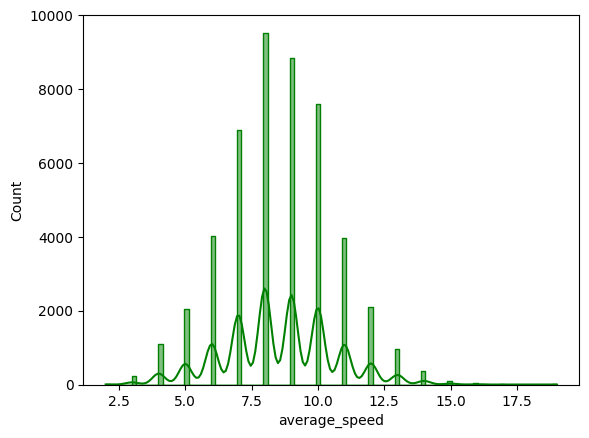

In [262]:
sns.histplot (new_df, x= "average_speed", element= "step", kde= True, color= "green")


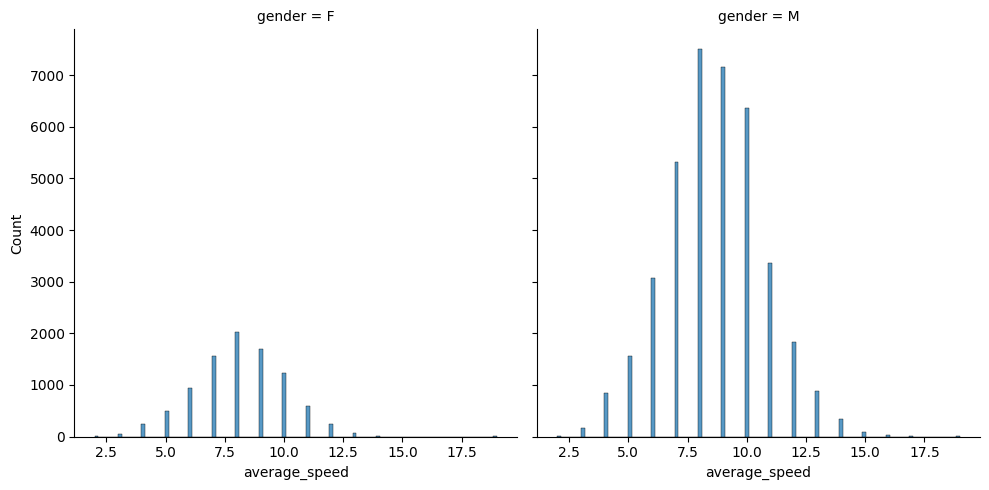

In [267]:
sns.displot (new_df, x= "average_speed", col= "gender", kind= "hist")

In [292]:
new_df.groupby (["gender"])["average_speed"].mean()

gender
F    8.139221
M    8.635466
Name: average_speed, dtype: float64

<Axes: xlabel='event_distance', ylabel='average_speed'>

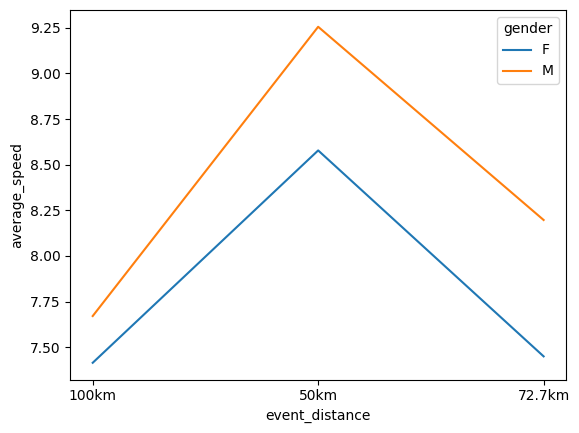

In [317]:
speed = new_df.groupby (["event_distance","gender"])["average_speed"].mean()
speed = pd.DataFrame(speed)
sns.lineplot (speed, x= "event_distance", y= "average_speed", hue= "gender")


In [277]:
avg_speed_vs_age= new_df.groupby(["Age_at_event"])["average_speed"].agg(["mean", "count"]).sort_values(by= "mean", ascending=False).query ("count>30")

In [278]:
avg_speed_vs_age

,mean,count
Age_at_event,,
21,9.446154,65
25,9.211765,170
28,9.123684,380
37,9.035211,994
36,9.031317,926
31,8.994604,556
23,8.978947,95
40,8.958243,1389
20,8.950000,40


In [279]:
px.scatter (avg_speed_vs_age, x= avg_speed_vs_age.index, y= "mean")

In [334]:
px.violin (new_df, x= "event_distance", y= "average_speed", color= "gender", violinmode= "overlay" ,title= "Violin Plot",  width= 850)

- Violin plot by seaborn

<Axes: xlabel='event_distance', ylabel='average_speed'>

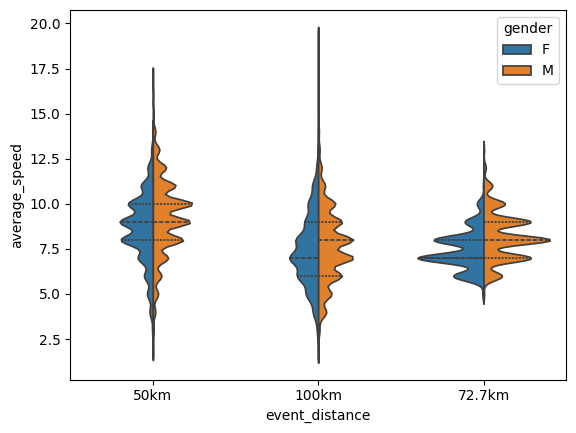

In [319]:
sns.violinplot (new_df, x= "event_distance", y= "average_speed", hue= "gender", inner= "quartz",split= True)

In [336]:
max_events= new_df["event_name"].value_counts().head()

In [339]:
max_events= pd.DataFrame (max_events)

In [340]:
max_events

,count
event_name,
GutsMuths-Rennsteiglauf (GER),5876
100 km Lauf Biel (SUI),4496
50km-Ultramarathon des RLT Rodgau (GER),2637
Alb Marathon Schwäbisch Gmünd (GER),2491
Schwäbische Alb Marathon (GER),1903


In [359]:
px.bar (max_events, x= max_events.index, y= "count", color= max_events.index, title= "Top 5 events organised the most")

In [364]:
new_df ["event_dates"] = pd.to_datetime (new_df ["event_dates"], errors= "coerce", dayfirst= True)

81663 3570 73066 74962

In [382]:
modified_for_date= new_df[~new_df["event_dates"].isna()]

In [392]:
modified_for_date['seasons']= modified_for_date["event_dates"].dt.month.apply(lambda x: 'winter' if x > 11 else 'autumn' if x > 8 else 'summer' if x > 3 else 'spring' if x > 2 else 'winter')

In [394]:
seasons_counter = modified_for_date["seasons"].value_counts ()

In [395]:
seasons_counter

seasons
summer    17410
autumn    14129
spring     4611
winter     4341
Name: count, dtype: int64

In [396]:
px.pie (seasons_counter, names= seasons_counter.index, values= seasons_counter.values, title= "Count of marathon based on seasons")

In [438]:
effect= modified_for_date.groupby (["seasons", "gender"])["average_speed"].agg (["mean", "count"]).sort_values("seasons", ascending=False)

In [444]:
effect

mean  count
seasons gender                 
winter  F       8.866596    937
        M       9.617509   3404
summer  F       7.700241   3316
        M       8.330353  14094
spring  F       9.036496    959
        M       9.784775   3652
autumn  F       8.712423   2761
        M       9.137491  11368

<Axes: xlabel='seasons', ylabel='mean'>

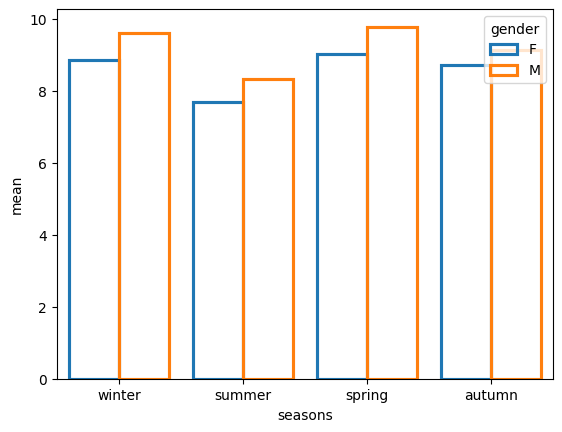

In [445]:
sns.barplot (effect, x= "seasons", y= "mean", hue= "gender", fill= False)

# Effect of seasons on average speed

- Effect in 50km

In [433]:
e_50km= modified_for_date.query('event_distance== "50km"').groupby ("seasons")["average_speed"].agg (["mean", "count"]).sort_values("seasons", ascending=False)

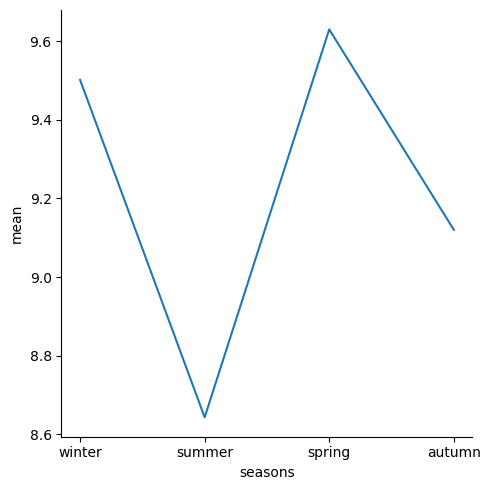

In [436]:
sns.relplot (e_50km, x= "seasons", y= "mean", kind= "line")

- Effect in 100km

In [432]:
e_100km= modified_for_date.query('event_distance== "100km"').groupby ("seasons")["average_speed"].agg (["mean", "count"]).sort_values("seasons", ascending=False)

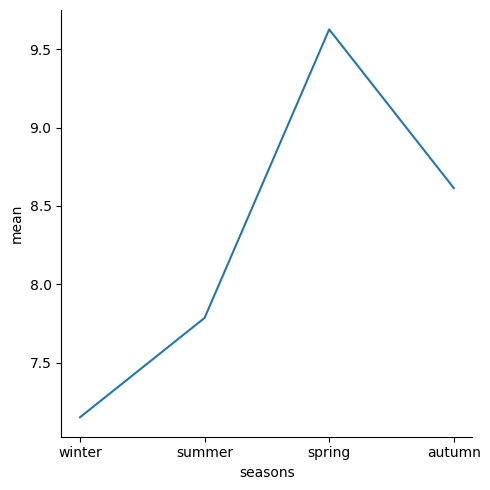

In [437]:
sns.relplot (e_100km, x= "seasons", y= "mean", kind= "line")